In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import shutil

from skimage.io import imread, imshow

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader

In [21]:
Path_Train_Images = './training/images/'
Path_Train_Masks = './training/1st_manual/'

Path_Test_Images = './test/images'
Path_Test_Masks = './test/1st_manual'

In [22]:
All_Train_Images = os.listdir(Path_Train_Images)
All_Train_Masks = os.listdir(Path_Train_Masks)
All_Test_Images = os.listdir(Path_Test_Images)
All_Test_Masks = os.listdir(Path_Test_Masks)

len(All_Train_Images), len(All_Train_Masks), len(All_Test_Images), len(All_Test_Masks)

(20, 20, 20, 20)

In [23]:
# # rename the file names to the first 2 digits
# for i in range(len(All_Train_Images)):
#     extension = All_Train_Images[i].split('.')[1]
#     os.rename(os.path.join(Path_Train_Images, All_Train_Images[i]), os.path.join(Path_Train_Images, All_Train_Images[i][:2] + '.' + extension))
    
# for i in range(len(All_Train_Masks)):
#     extension = All_Train_Masks[i].split('.')[1]
#     os.rename(os.path.join(Path_Train_Masks, All_Train_Masks[i]), os.path.join(Path_Train_Masks, All_Train_Masks[i][:2] + '.' + extension))

# for i in range(len(All_Test_Images)):
#     extension = All_Test_Images[i].split('.')[1]
#     os.rename(os.path.join(Path_Test_Images, All_Test_Images[i]), os.path.join(Path_Test_Images, All_Test_Images[i][:2] + '.' + extension))

# for i in range(len(All_Test_Masks)):
#     extension = All_Test_Masks[i].split('.')[1]
#     os.rename(os.path.join(Path_Test_Masks, All_Test_Masks[i]), os.path.join(Path_Test_Masks, All_Test_Masks[i][:2] + '.' + extension))

In [24]:
All_Train_Images = os.listdir(Path_Train_Images)
All_Train_Masks = os.listdir(Path_Train_Masks)
All_Test_Images = os.listdir(Path_Test_Images)
All_Test_Masks = os.listdir(Path_Test_Masks)

In [25]:
DF = pd.DataFrame()

Images = []
for i in range(len(All_Train_Images)):
    Images.append(os.path.join(Path_Train_Images, All_Train_Images[i]))

Masks = []
for i in range(len(All_Train_Masks)):
    Masks.append(os.path.join(Path_Train_Masks, All_Train_Masks[i]))
    
for i in range(len(All_Test_Images)):
    Images.append(os.path.join(Path_Test_Images, All_Test_Images[i]))

for i in range(len(All_Test_Masks)):
    Masks.append(os.path.join(Path_Test_Masks, All_Test_Masks[i]))

DF['Images'] = Images
DF['Masks'] = Masks
DF

,Images,Masks
0,./training/images/23.tif,./training/1st_manual/30.gif
1,./training/images/30.tif,./training/1st_manual/28.gif
2,./training/images/34.tif,./training/1st_manual/34.gif
3,./training/images/33.tif,./training/1st_manual/21.gif
4,./training/images/32.tif,./training/1st_manual/38.gif
5,./training/images/35.tif,./training/1st_manual/24.gif
6,./training/images/36.tif,./training/1st_manual/31.gif
7,./training/images/29.tif,./training/1st_manual/36.gif
8,./training/images/37.tif,./training/1st_manual/37.gif
9,./training/images/31.tif,./training/1st_manual/27.gif


In [26]:
DF

,Images,Masks
0,./training/images/23.tif,./training/1st_manual/30.gif
1,./training/images/30.tif,./training/1st_manual/28.gif
2,./training/images/34.tif,./training/1st_manual/34.gif
3,./training/images/33.tif,./training/1st_manual/21.gif
4,./training/images/32.tif,./training/1st_manual/38.gif
5,./training/images/35.tif,./training/1st_manual/24.gif
6,./training/images/36.tif,./training/1st_manual/31.gif
7,./training/images/29.tif,./training/1st_manual/36.gif
8,./training/images/37.tif,./training/1st_manual/37.gif
9,./training/images/31.tif,./training/1st_manual/27.gif


In [27]:
Train_DF = DF.iloc[:20]
Test_DF = DF.iloc[20:]

In [28]:
Train_DF.reset_index(inplace=True, drop=True)
Test_DF.reset_index(inplace=True, drop=True)

Train_DF.to_csv('Train_DF.csv', index=False)
Test_DF.to_csv('Test_DF.csv', index=False)

In [29]:
Train_DF

,Images,Masks
0,./training/images/23.tif,./training/1st_manual/30.gif
1,./training/images/30.tif,./training/1st_manual/28.gif
2,./training/images/34.tif,./training/1st_manual/34.gif
3,./training/images/33.tif,./training/1st_manual/21.gif
4,./training/images/32.tif,./training/1st_manual/38.gif
5,./training/images/35.tif,./training/1st_manual/24.gif
6,./training/images/36.tif,./training/1st_manual/31.gif
7,./training/images/29.tif,./training/1st_manual/36.gif
8,./training/images/37.tif,./training/1st_manual/37.gif
9,./training/images/31.tif,./training/1st_manual/27.gif


In [30]:
Test_DF

,Images,Masks
0,./test/images/19.tif,./test/1st_manual/08.gif
1,./test/images/11.tif,./test/1st_manual/09.gif
2,./test/images/13.tif,./test/1st_manual/04.gif
3,./test/images/07.tif,./test/1st_manual/20.gif
4,./test/images/17.tif,./test/1st_manual/01.gif
5,./test/images/18.tif,./test/1st_manual/07.gif
6,./test/images/01.tif,./test/1st_manual/14.gif
7,./test/images/12.tif,./test/1st_manual/15.gif
8,./test/images/03.tif,./test/1st_manual/19.gif
9,./test/images/08.tif,./test/1st_manual/13.gif


In [31]:
#write a transforms
import torchvision
Transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.Resize((256, 256)),
    torchvision.transforms.ToTensor()
])

In [32]:
class Dataset(Dataset):
    def __init__(self, DF, transforms=None):
        self.DF = DF
        self.len = len(DF)
        self.Images = self.DF['Images']
        self.Masks = self.DF['Masks']
        self.transforms = transforms
        
    def __len__(self):
        return self.len
    
    def __getitem__(self, index):
        Image = imread(self.Images[index])
        Mask = imread(self.Masks[index])

        Image = self.transforms(Image)
        Mask = self.transforms(Mask)
        
        return Image, Mask

In [33]:
Train_Dataset = Dataset(Train_DF, transforms=Transforms)
Test_Dataset = Dataset(Test_DF, transforms=Transforms)

Train_Dataloader = DataLoader(Train_Dataset, batch_size=1, shuffle=True)
Test_Dataloader = DataLoader(Test_Dataset, batch_size=1, shuffle=True)

In [34]:
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU()
        
    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        return x
     
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))
        
    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)
        return x, p
    
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)
        
    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x
    
class build_unet(nn.Module):
    def __init__(self):
        super().__init__()
        """ Encoder """
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)
        """ Bottleneck """
        self.b = conv_block(512, 1024)
        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)
        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0) 
        
    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)
        """ Bottleneck """
        b = self.b(p4)
        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)
        """ Classifier """
        outputs = self.outputs(d4)
        return outputs

In [35]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [36]:
Model = build_unet().to(device)

In [37]:
lr = 0.001
optim = torch.optim.Adam(Model.parameters(), lr=lr)
Loss = nn.BCEWithLogitsLoss()

Epoch: 1/50, Step: 5/20, Loss: 4.4592
Epoch: 1/50, Step: 10/20, Loss: 8.6444
Epoch: 1/50, Step: 15/20, Loss: 12.7236
Epoch: 1/50, Step: 20/20, Loss: 16.7363


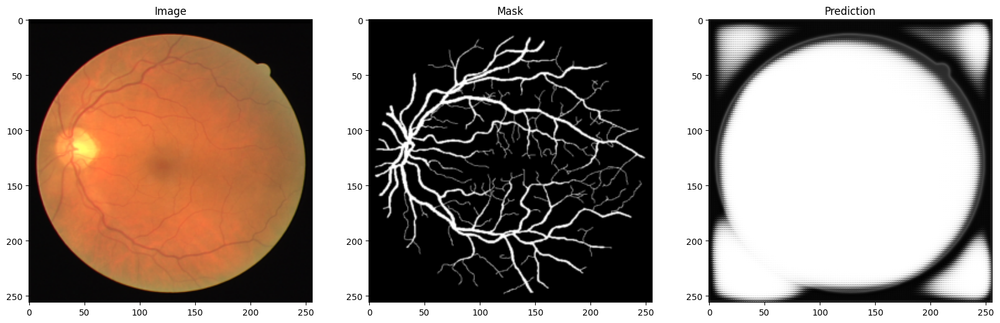

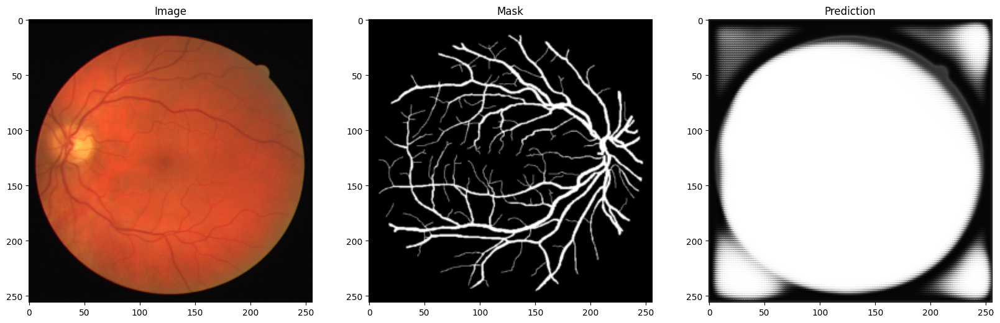

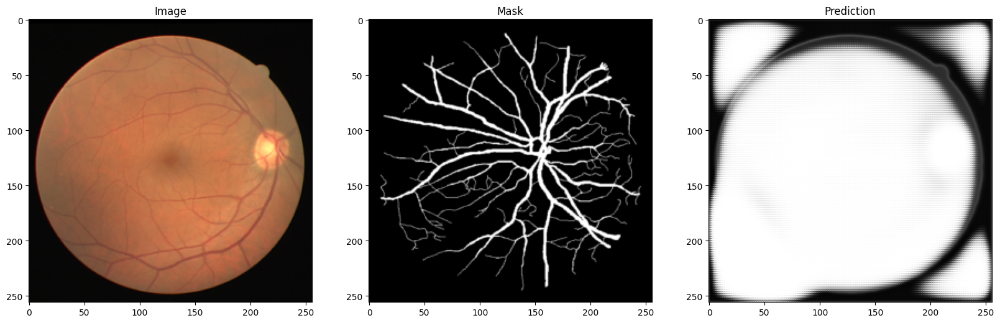

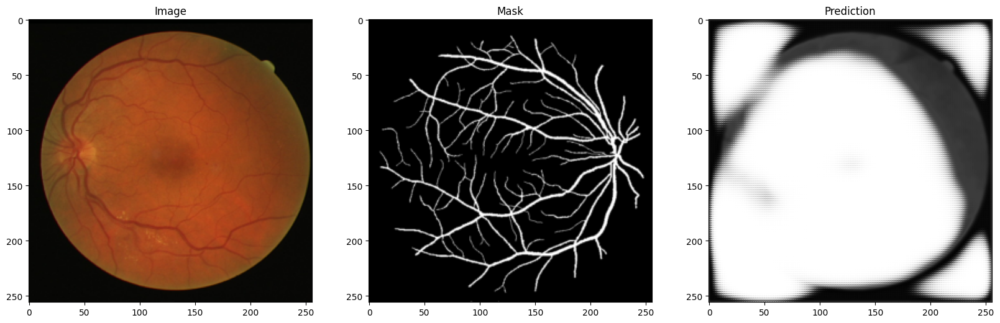

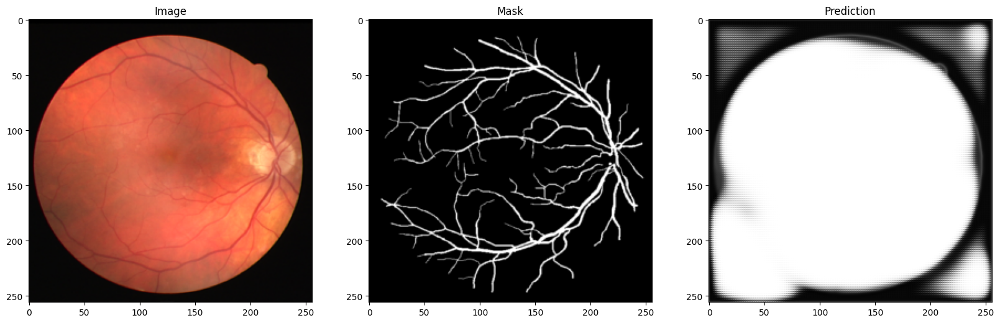

...

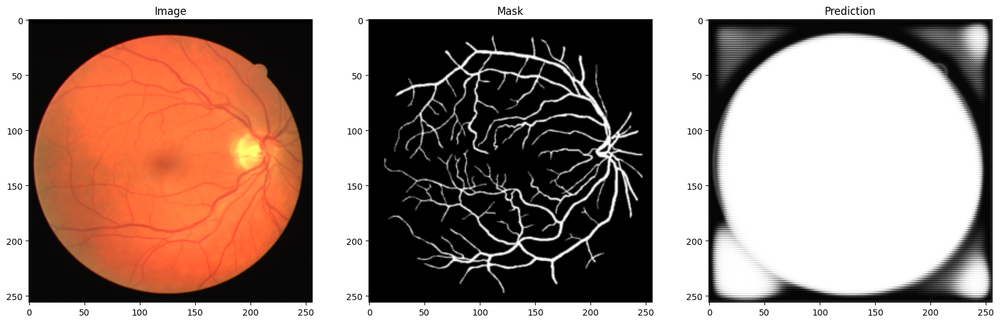

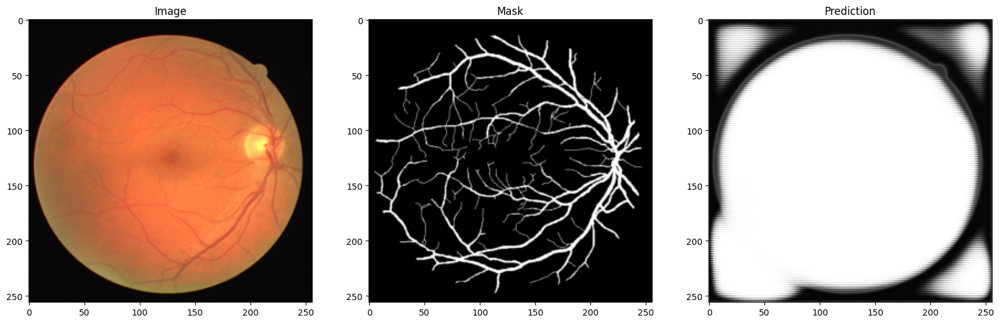

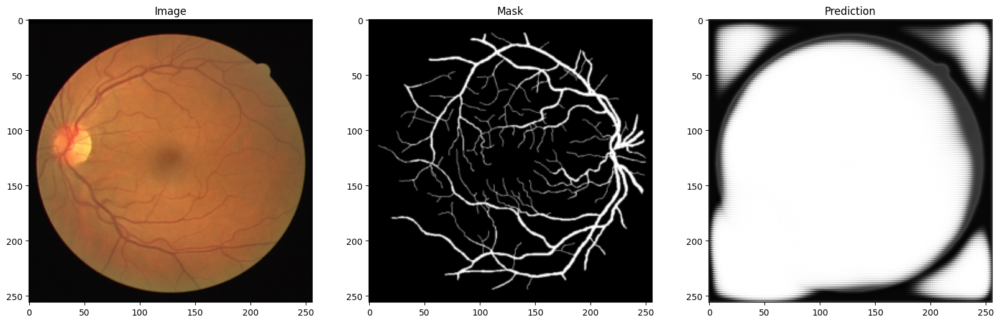

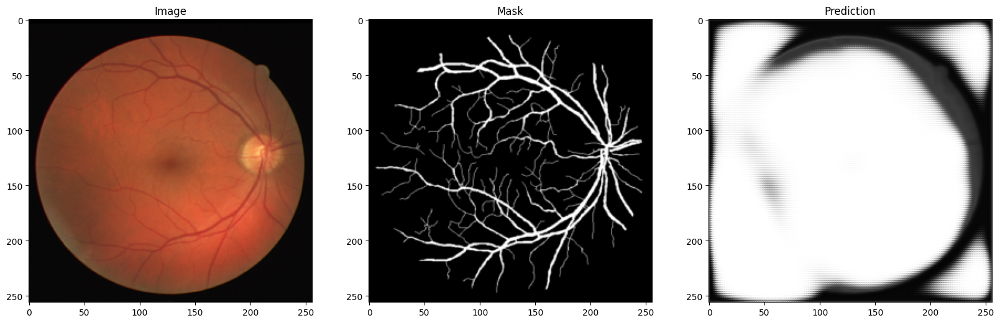

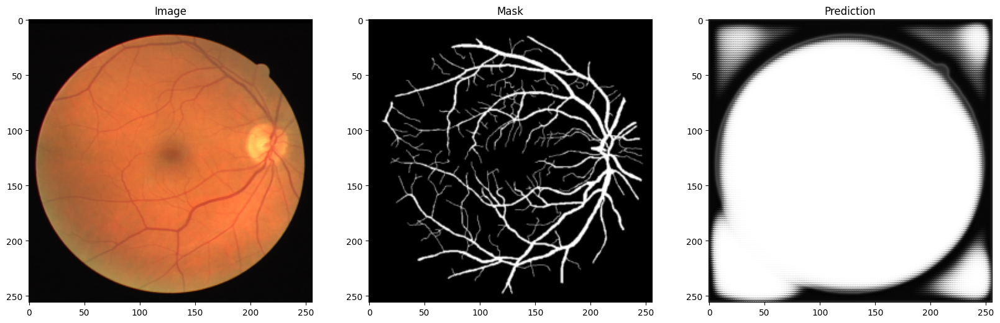

--------------------------------------------------------


Epoch: 2/50, Step: 5/20, Loss: 4.2673
Epoch: 2/50, Step: 10/20, Loss: 7.7331
Epoch: 2/50, Step: 15/20, Loss: 11.1988
Epoch: 2/50, Step: 20/20, Loss: 14.6646


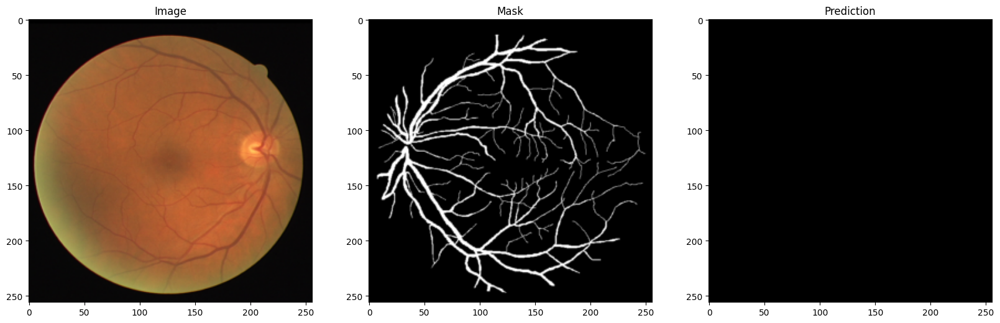

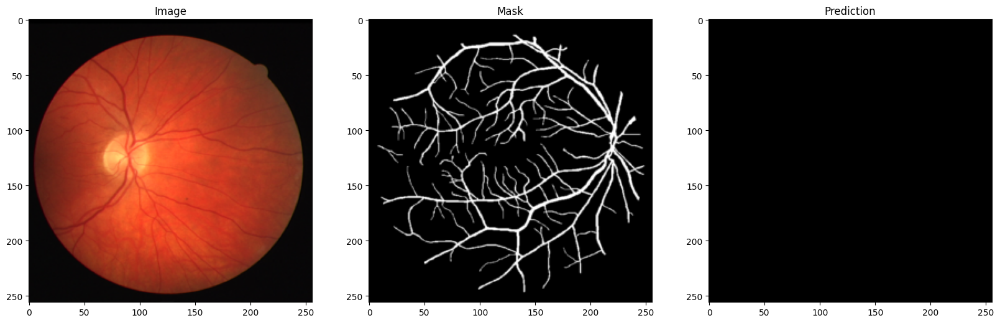

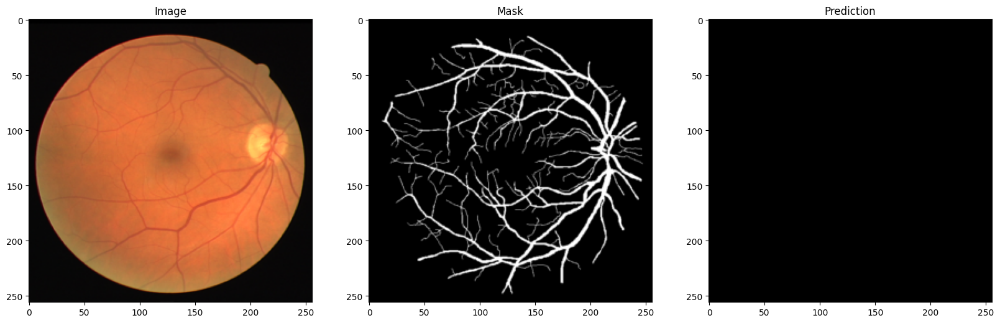

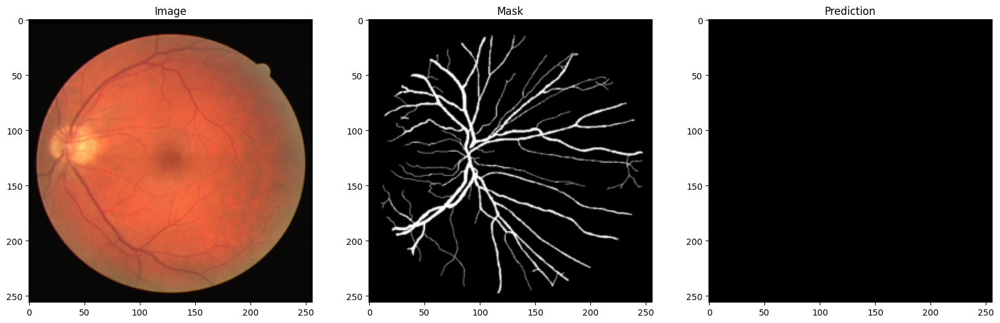

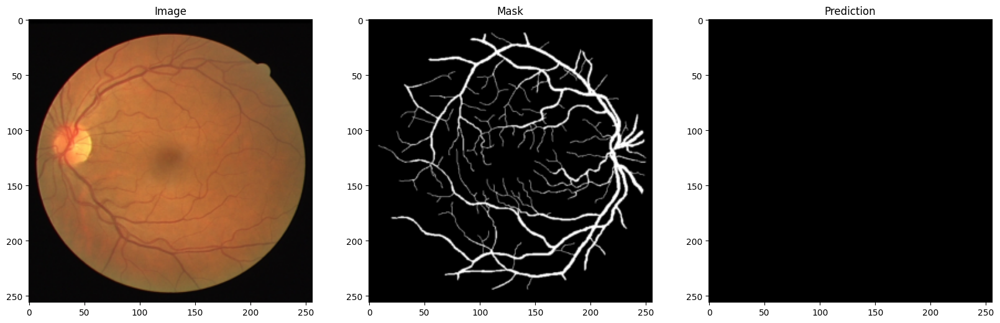

...

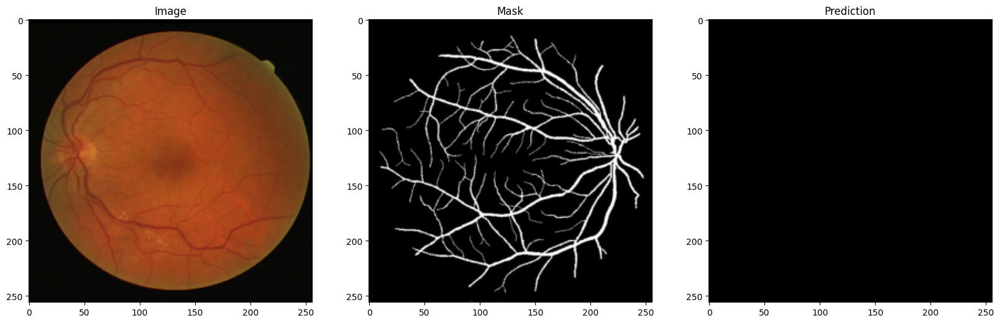

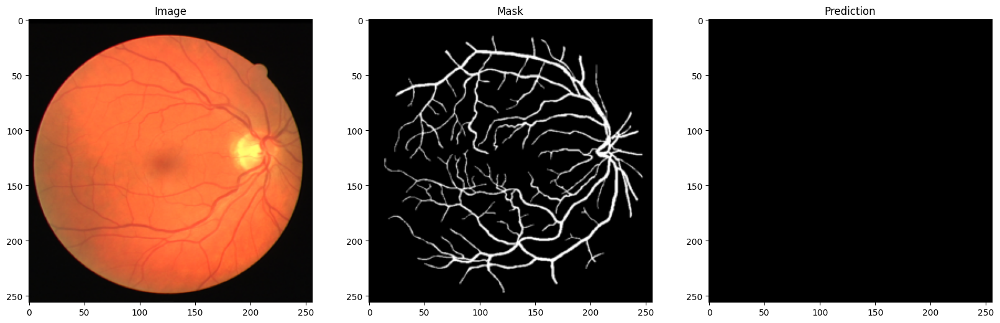

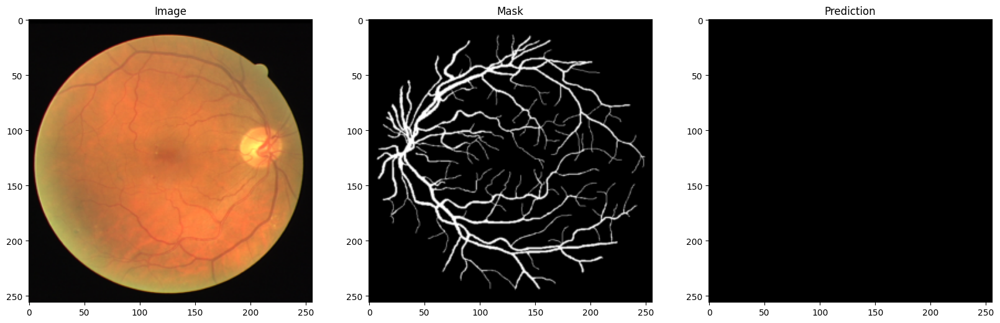

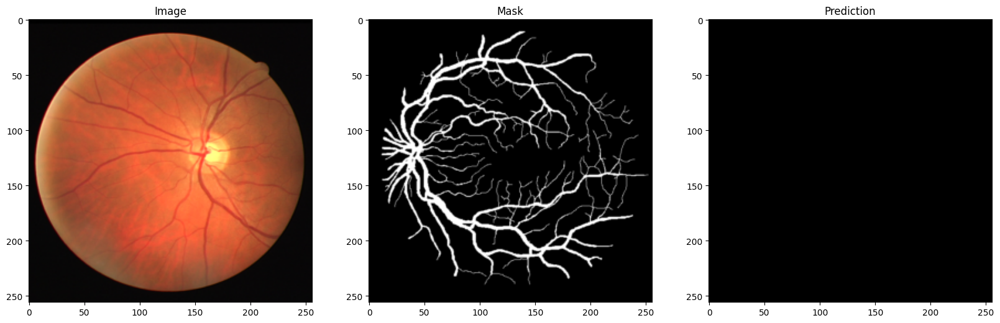

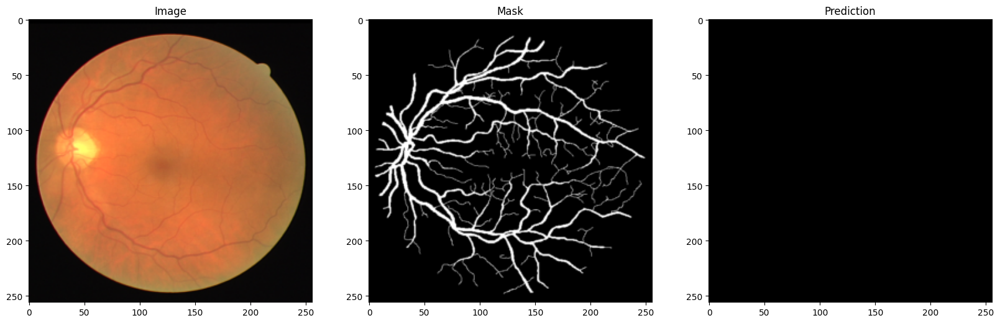

--------------------------------------------------------


Epoch: 3/50, Step: 5/20, Loss: 3.4657
Epoch: 3/50, Step: 10/20, Loss: 6.9315
Epoch: 3/50, Step: 15/20, Loss: 10.3972
Epoch: 3/50, Step: 20/20, Loss: 13.8629


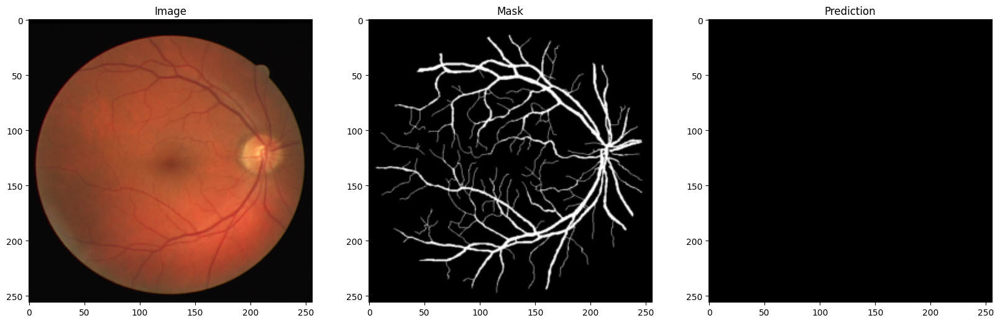

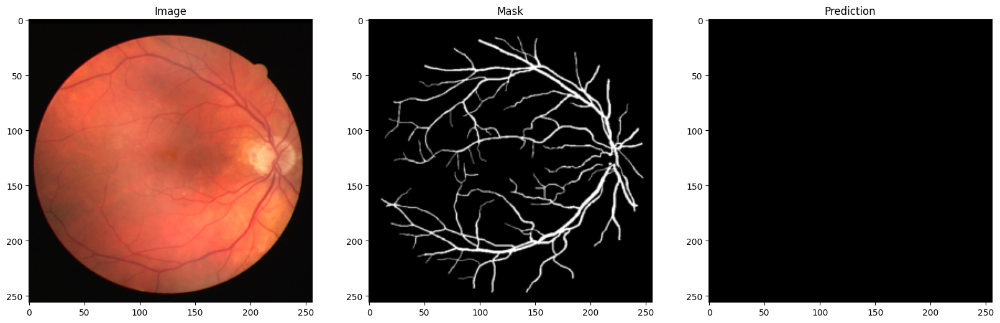

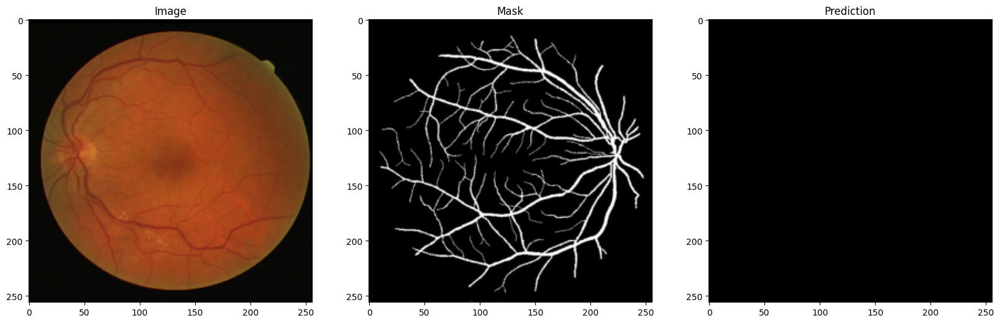

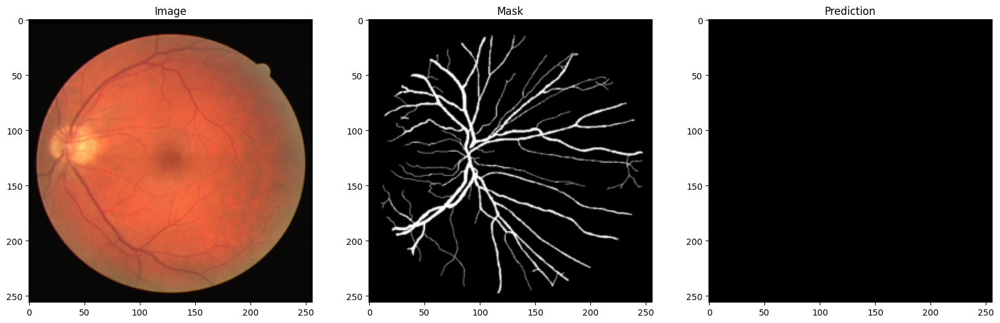

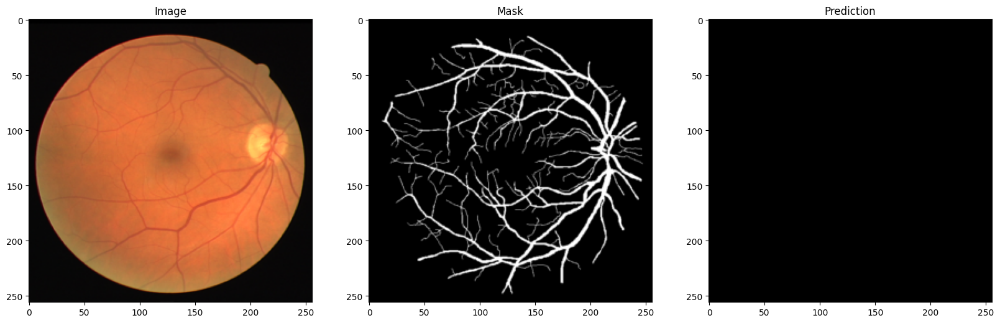

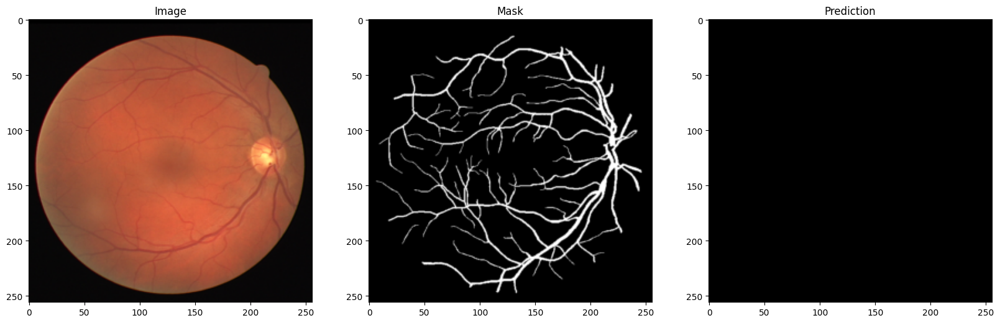

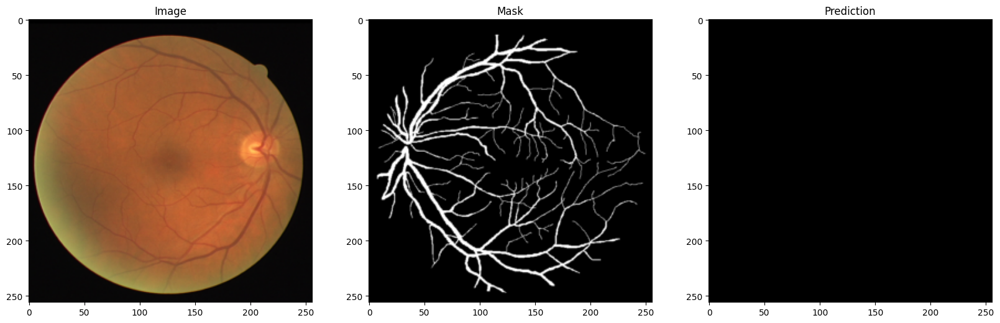

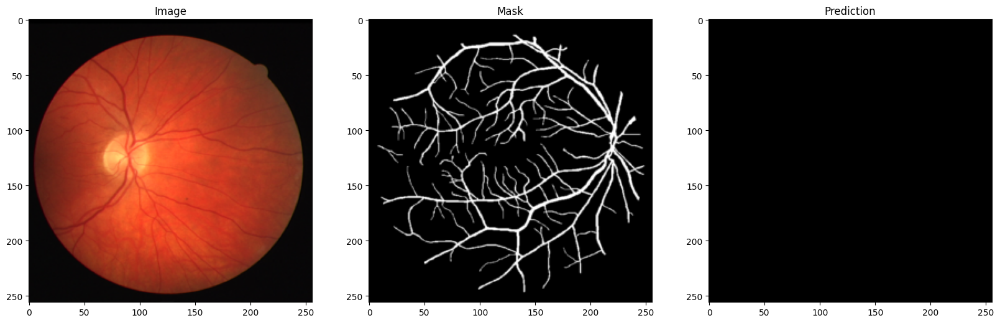

KeyboardInterrupt: 

In [40]:
#write training loop and implement Intersection over Union (IoU) as the evaluation metric, and also display image, mask, prediction

epochs = 50
for epoch in range(epochs):
    Running_Epoch = 0.0
    for i, (images, masks) in enumerate(Train_Dataloader):
        images = images.to(device)
        masks = masks.to(device)
        
        optim.zero_grad()
        outputs = Model(images)
        outputs = torch.nn.Sigmoid()(outputs)
        loss = Loss(outputs, masks)
        Running_Epoch += loss.item()
        loss.backward()
        optim.step()
        
        if (i+1) % 5 == 0:
            print(f'Epoch: {epoch+1}/{epochs}, Step: {i+1}/{len(Train_Dataloader)}, Loss: {np.mean(Running_Epoch):.4f}')
        
    torch.save(Model.state_dict(), 'Model.pth')

    Model.eval()
    with torch.no_grad():
        for i, (images, masks) in enumerate(Test_Dataloader):
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = Model(images)
            outputs = torch.nn.Sigmoid()(outputs)
            
            plt.figure(figsize=(20, 10))
            plt.subplot(1, 3, 1)
            plt.imshow(images[0].permute(1, 2, 0))
            plt.title('Image')
            plt.subplot(1, 3, 2)
            plt.imshow(masks[0].permute(1, 2, 0), cmap='gray')
            plt.title('Mask')
            plt.subplot(1, 3, 3)
            plt.imshow(outputs[0].permute(1, 2, 0), cmap='gray')
            plt.title('Prediction')
            plt.show()
            
            if i == 10:
                break
    print('--------------------------------------------------------\n\n')